#Importing used libiraries

In [36]:
import os
import cv2
import time
import random
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
import seaborn as sns
import matplotlib.pyplot as plt
tf.__version__, np.__version__
from tensorflow.keras import backend, layers, metrics
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import Xception
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.utils import plot_model
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import load_model
from google.colab.patches import cv2_imshow
import warnings

Mounting Googel dive

In [37]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data preparation

## Reading and preprocessing Training data

In [38]:
# Setting random seeds to enable consistency while testing.
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

Training_ROOT = r"/content/drive/MyDrive/Product Recoginition/Training Data"

image_generator = ImageDataGenerator(
    rescale=1 / 255,
    rotation_range=10,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.2, 1.2]
)

def read_train_images(index , augment=True):
    path = os.path.join(Training_ROOT, index[0], index[1])
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (200,200))
    image= image.astype(np.float32)
    image=image/255

    if augment:
        # Reshape the image to (1, height, width, channels) as required by the flow method
        image = image.reshape((1,) + image.shape)
        # Generate augmented images
        augmented_images = image_generator.flow(image)
        # Get the first augmented image
        image = augmented_images[0][0]


    return image


## Reading and preprocessing Testing data

In [39]:
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

Testing_ROOT = r"/content/drive/MyDrive/Product Recoginition/Validation Data"

def read_test_image(index):
    path = os.path.join(Testing_ROOT, index[0], index[1])
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (200,200))
   # Normalization
    image= image.astype(np.float32)
    image=image/255

    return image

## Creating training and testing lists

In [40]:
def creating_the_list(directory):
    folders = os.listdir(directory)
    num_test = int(len(folders))  # Assuming you want 20% of the data for testing

    random.shuffle(folders)

    created_list = {}

    # Creating Test-list (not Train-list)
    for folder in folders[:num_test]:
        num_files = sum(1 for file in os.listdir(os.path.join(directory, folder)) if file.lower().endswith(('.png', '.jpeg')))
        created_list[folder] = num_files

    return created_list

# Testing_ROOT = 'your_testing_data_directory_path'

train_list= creating_the_list(Training_ROOT)
print("Length of training list:", len(train_list))



testing_list = creating_the_list(Testing_ROOT)
print("Length of testing list:", len(testing_list))

# test_list contains the folder names along with the number of files with ".png" or ".jpeg" extensions.
print("\nTesting List:", testing_list)


Length of training list: 40
Length of testing list: 20

Testing List: {'48': 6, '43': 5, '52': 5, '42': 6, '46': 6, '53': 6, '59': 6, '47': 6, '41': 6, '60': 5, '56': 6, '45': 6, '57': 5, '49': 5, '58': 6, '44': 6, '54': 6, '50': 6, '51': 5, '55': 5}


## Create triplets from training and testing data

In [41]:
def create_triplets(directory, folder_list, max_files=14):
    triplets = []
    folders = list(folder_list.keys())

    for folder in folders:
        path = os.path.join(directory, folder)
        files = [file for file in os.listdir(path) if file != 'Thumbs.db'][:max_files]
        num_files = len(files)

        for i in range(num_files-1):
            for j in range(i+1, num_files):
                anchor = (folder, files[i])
                positive = (folder, files[j])

                neg_folder = folder
                while neg_folder == folder:
                    neg_folder = random.choice(folders)
                neg_files = [file for file in os.listdir(os.path.join(directory, neg_folder)) if file != 'Thumbs.db']
                neg_file = random.choice(neg_files)
                negative = (neg_folder, neg_file)

                triplets.append((anchor, positive, negative))

    random.shuffle(triplets)
    return triplets


In [42]:
train_triplet = create_triplets(Training_ROOT, train_list)

print("Number of training triplets:", len(train_triplet))

test_triplet=create_triplets(Testing_ROOT,testing_list)
print("Number of testing triplets :", len(test_triplet))


Number of training triplets: 1064
Number of testing triplets : 265


## Creating Batch-Generator
Creating a Batch-Generator that converts the triplets passed into batches.

In [43]:
def get_train_batch(triplet_list, batch_size=32):
    batch_steps = len(triplet_list)//batch_size

    for i in range(batch_steps+1):
        anchor   = []
        positive = []
        negative = []

        j = i*batch_size
        while j<(i+1)*batch_size and j<len(triplet_list):
            a, p, n = triplet_list[j]
            anchor.append(read_train_images(a,False))
            positive.append(read_train_images(p,False))
            negative.append(read_train_images(n,False))
            j+=1

        anchor = np.array(anchor)
        positive = np.array(positive)
        negative = np.array(negative)


        yield ([anchor, positive, negative])


In [44]:
def get_test_batch(triplet_list, batch_size=32):
    batch_steps = len(triplet_list)//batch_size

    for i in range(batch_steps+1):
        anchor   = []
        positive = []
        negative = []

        j = i*batch_size
        while j<(i+1)*batch_size and j<len(triplet_list):
            a, p, n = triplet_list[j]
            anchor.append(read_test_image(a))
            positive.append(read_test_image(p))
            negative.append(read_test_image(n))
            j+=1

        anchor = np.array(anchor)
        positive = np.array(positive)
        negative = np.array(negative)


        yield ([anchor, positive, negative])


## Visualizing the data

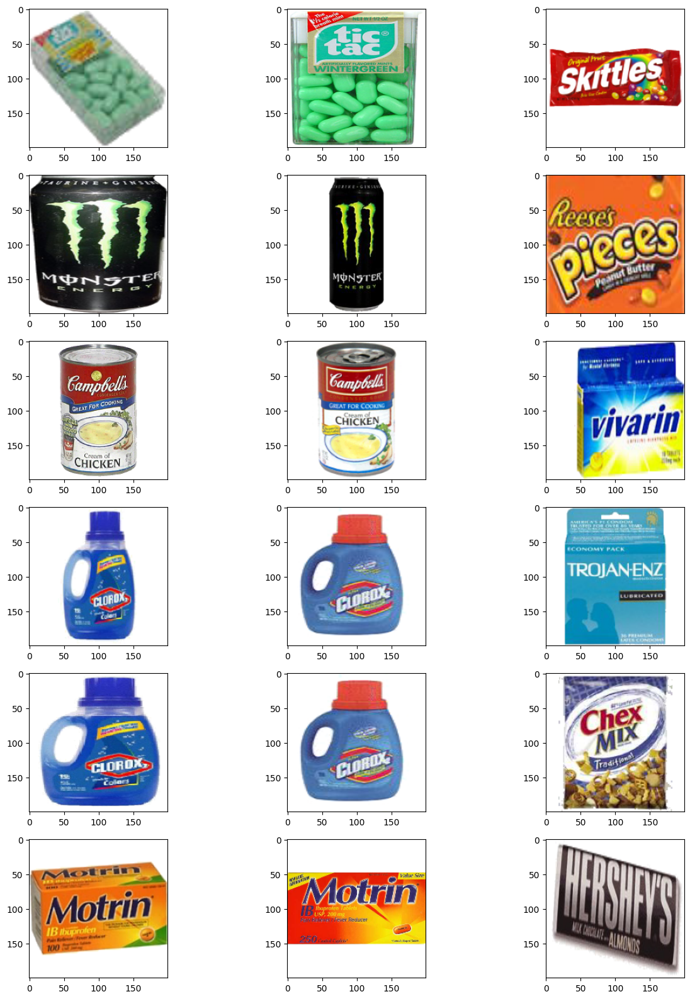

In [45]:
num_plots = 6

f, axes = plt.subplots(num_plots, 3, figsize=(15, 20))

for x in get_train_batch(train_triplet, batch_size=num_plots):
    a,p,n = x
    for i in range(num_plots):
        axes[i, 0].imshow(a[i])
        axes[i, 1].imshow(p[i])
        axes[i, 2].imshow(n[i])
        i+=1
    break

# Encoder
To convert the passed images into their feature vectors. We're using a pretrained model, Xception model which is based on Inception_V3 model. By using transfer learning.

The Xception model is pre-trained on ImageNet and frozen up to the 10th from the last layer.
L2 regularization is applied to the Dense layers to prevent overfitting.
Dropout is used for regularization to improve generalization.

In [46]:
def get_encoder(input_shape,l2_penalty=1e-4,dropout_rate=0.5):
    """ Returns the image encoding model """

    pretrained_model = Xception(
        input_shape=input_shape,
        weights='imagenet',
        include_top=False,
        pooling='avg',
    )

    for i in range(len(pretrained_model.layers)-10):
        pretrained_model.layers[i].trainable = False

    encode_model = Sequential([
        pretrained_model,
        layers.Flatten(),
        layers.Dense(512, activation='relu'),
        layers.BatchNormalization(),
        Dropout(dropout_rate),

        layers.Dense(256, activation="relu"),
        layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))
    ], name="Encode_Model")

    return encode_model


# Siamese Network
We're creating a Siamese Network that takes 3 input images, (anchor, postive, negative) and uses the encoder above to encode the images to their feature vectors. Those features are passed to a distance layer which computes the distance between (anchor, positive) and (anchor, negative) pairs.

In [47]:
class DistanceLayer(layers.Layer):
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return (ap_distance, an_distance)


def get_siamese_network(input_shape = (200, 200, 3)):
    encoder = get_encoder(input_shape)

    # Input Layers for the images
    anchor_input   = layers.Input(input_shape, name="Anchor_Input")
    positive_input = layers.Input(input_shape, name="Positive_Input")
    negative_input = layers.Input(input_shape, name="Negative_Input")

    ## Generate the encodings (feature vectors) for the images
    encoded_a = encoder(anchor_input)
    encoded_p = encoder(positive_input)
    encoded_n = encoder(negative_input)

    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    distances = DistanceLayer()(
        encoder(anchor_input),
        encoder(positive_input),
        encoder(negative_input)
    )

    # Creating the Model
    siamese_network = Model(
        inputs  = [anchor_input, positive_input, negative_input],
        outputs = distances,
        name = "Siamese_Network"
    )
    return siamese_network

siamese_network = get_siamese_network()
siamese_network.summary()

Model: "Siamese_Network"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 Anchor_Input (InputLayer)   [(None, 200, 200, 3)]        0         []                            
                                                                                                  
 Positive_Input (InputLayer  [(None, 200, 200, 3)]        0         []                            
 )                                                                                                
                                                                                                  
 Negative_Input (InputLayer  [(None, 200, 200, 3)]        0         []                            
 )                                                                                                
                                                                                    

In [48]:
class SiameseModel(Model):
    # Builds a Siamese model based on a base-model
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()

        self.margin = margin
        self.siamese_network = siamese_network
        self.loss_tracker = metrics.Mean(name="loss")

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        # GradientTape get the gradients when we compute loss, and uses them to update the weights
        with tf.GradientTape() as tape:
            loss = self._compute_loss(data)

        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.siamese_network.trainable_weights))

        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        loss = self._compute_loss(data)

        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def _compute_loss(self, data):
        # Get the two distances from the network, then compute the triplet loss
        ap_distance, an_distance = self.siamese_network(data)
        loss = tf.maximum(ap_distance - an_distance + self.margin, 0.0)
        return loss

    @property
    def metrics(self):
        # We need to list our metrics so the reset_states() can be called automatically.
        return [self.loss_tracker]

In [49]:
from tensorflow.keras.optimizers import Nadam

siamese_model = SiameseModel(siamese_network)
optimizer = Nadam(learning_rate=1e-4, epsilon=1e-01)
siamese_model.compile(optimizer=optimizer)


## Training the Model
We'll now be training the siamese_model on batches of triplets. We'll print the training loss,The model weights will also be saved whenever it outperforms the previous max_accuracy.



### Test Function
for testing the model on test_triplets.

In [50]:
def test_on_triplets(batch_size = 32):
    pos_scores, neg_scores = [], []

    for data in get_test_batch(test_triplet, batch_size=batch_size):
        prediction = siamese_model.predict(data)
        pos_scores += list(prediction[0])
        neg_scores += list(prediction[1])

    accuracy = np.sum(np.array(pos_scores) < np.array(neg_scores)) / len(pos_scores)
    ap_mean = np.mean(pos_scores)
    an_mean = np.mean(neg_scores)
    ap_stds = np.std(pos_scores)
    an_stds = np.std(neg_scores)

    print(f"Accuracy on Validation = {accuracy:.5f}")
    return (accuracy, ap_mean, an_mean, ap_stds, an_stds)

In [51]:
save_all = False
epochs = 15
batch_size = 32

max_acc = 0
train_loss = []
test_metrics = []

for epoch in range(1, epochs+1):
    t = time.time()

    # Training the model on train data
    epoch_loss = []
    warnings.simplefilter("ignore", category=UserWarning, append=True)

    for data in get_train_batch(train_triplet, batch_size=batch_size):
        loss = siamese_model.train_on_batch(data)
        epoch_loss.append(loss)
    epoch_loss = sum(epoch_loss)/len(epoch_loss)
    train_loss.append(epoch_loss)

    print(f"\nEPOCH: {epoch} \t (Epoch done in {int(time.time()-t)} sec)")
    print(f"Loss on train    = {epoch_loss:.5f}")

    # Testing the model on Validation data
    metric = test_on_triplets(batch_size=batch_size)
    test_metrics.append(metric)
    accuracy = metric[0]

    # Saving the model weights
    if save_all or accuracy>=max_acc:
        siamese_model.save_weights("siamese_model")
        max_acc = accuracy

# Saving the model after all epochs run
siamese_model.save("/content/drive/MyDrive/siamese_model-final")


EPOCH: 1 	 (Epoch done in 44 sec)
Loss on train    = 0.42961
1/1 [==============================] - 3s 3s/step
Accuracy on Validation = 0.95472

EPOCH: 2 	 (Epoch done in 35 sec)
Loss on train    = 0.13992
1/1 [==============================] - 0s 34ms/step
Accuracy on Validation = 0.95094

EPOCH: 3 	 (Epoch done in 31 sec)
Loss on train    = 0.05592
1/1 [==============================] - 0s 69ms/step
Accuracy on Validation = 0.94717

EPOCH: 4 	 (Epoch done in 33 sec)
Loss on train    = 0.02579
1/1 [==============================] - 0s 33ms/step
Accuracy on Validation = 0.95472

EPOCH: 5 	 (Epoch done in 30 sec)
Loss on train    = 0.01228
1/1 [==============================] - 0s 32ms/step
Accuracy on Validation = 0.93962

EPOCH: 6 	 (Epoch done in 31 sec)
Loss on train    = 0.00517
1/1 [==============================] - 0s 37ms/step
Accuracy on Validation = 0.94717

EPOCH: 7 	 (Epoch done in 30 sec)
Loss on train    = 0.00220
1/1 [==============================] - 0s 50ms/step
Accura

Saving the encoder for later use.

In [52]:
def extract_encoder(model):
    encoder = get_encoder((200, 200, 3))
    i=0
    for e_layer in model.layers[0].layers[3].layers:
        layer_weight = e_layer.get_weights()
        encoder.layers[i].set_weights(layer_weight)
        i+=1
    return encoder

encoder = extract_encoder(siamese_model)
encoder.save("/content/drive/MyDrive/encoder")
encoder.summary()

Model: "Encode_Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 2048)              20861480  
                                                                 
 flatten_3 (Flatten)         (None, 2048)              0         
                                                                 
 dense_6 (Dense)             (None, 512)               1049088   
                                                                 
 batch_normalization_19 (Ba  (None, 512)               2048      
 tchNormalization)                                               
                                                                 
 dropout_3 (Dropout)         (None, 512)               0         
                                                                 
 dense_7 (Dense)             (None, 256)               131328    
                                                      

## Classify Images
To compute the distance between the encodings of the images,and decide beased on the threshold

In [53]:
def classify_images(image_list1, image_list2, threshold=1.3):
    # Getting the encodings for the passed images
    tensor1 = encoder.predict(image_list1)
    tensor2 = encoder.predict(image_list2)

    distance = np.sum(np.square(tensor1-tensor2), axis=-1)
    prediction = np.where(distance<=threshold, 0, 1)
    return prediction

1/1 [==============================] - 0s 27ms/step

Accuracy of model: 0.796875



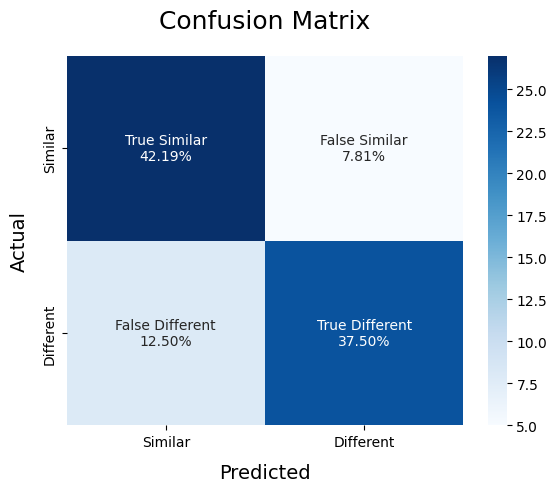

In [54]:
def ModelMetrics(pos_list, neg_list):
    true = np.array([0]*len(pos_list)+[1]*len(neg_list))
    pred = np.append(pos_list, neg_list)

    # Compute and print the accuracy
    print(f"\nAccuracy of model: {accuracy_score(true, pred)}\n")

    # Compute and plot the Confusion matrix
    cf_matrix = confusion_matrix(true, pred)

    categories  = ['Similar','Different']
    names = ['True Similar','False Similar', 'False Different','True Different']
    percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]

    labels = [f'{v1}\n{v2}' for v1, v2 in zip(names, percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cf_matrix, annot = labels, cmap = 'Blues',fmt = '',
                xticklabels = categories, yticklabels = categories)

    plt.xlabel("Predicted", fontdict = {'size':14}, labelpad = 10)
    plt.ylabel("Actual"   , fontdict = {'size':14}, labelpad = 10)
    plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)


pos_list = np.array([])
neg_list = np.array([])

for data in get_test_batch(test_triplet, batch_size=32):
    a, p, n = data
    pos_list = np.append(pos_list, classify_images(a, p))
    neg_list = np.append(neg_list, classify_images(a, n))
    break

ModelMetrics(pos_list, neg_list)

# Testing Scripts

#### Preprocesse an image (recognition)

In [55]:
def read_script_image(path):

    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (200,200))
    image = np.expand_dims(image, axis=0)

    # Normalization
    image= image.astype(np.float32)
    image=image/255

    return image

#### testscript for part b (recognition) - case 1

Prediction for Class 3
Predicting image (web1.png) class
1/1 [==============================] - 0s 21ms/step
9
[0.]
1/1 [==============================] - 0s 22ms/step
8
[0.]
1/1 [==============================] - 0s 21ms/step
7
[0.]
1/1 [==============================] - 0s 21ms/step
6
[0.]
1/1 [==============================] - 0s 21ms/step
5
[0.]
1/1 [==============================] - 0s 22ms/step
40
[0.]
1/1 [==============================] - 0s 21ms/step
4
[0.]
1/1 [==============================] - 0s 21ms/step
39
[0.]
1/1 [==============================] - 0s 26ms/step
38
[0.]
1/1 [==============================] - 0s 21ms/step
37
[0.]
1/1 [==============================] - 0s 21ms/step
36
[0.]
1/1 [==============================] - 0s 20ms/step
35
[0.]
1/1 [==============================] - 0s 21ms/step
34
[0.]
1/1 [==============================] - 0s 21ms/step
33
[0.]
1/1 [==============================] - 0s 20ms/step
32
[0.]
1/1 [==============================] - 0s 20ms/st

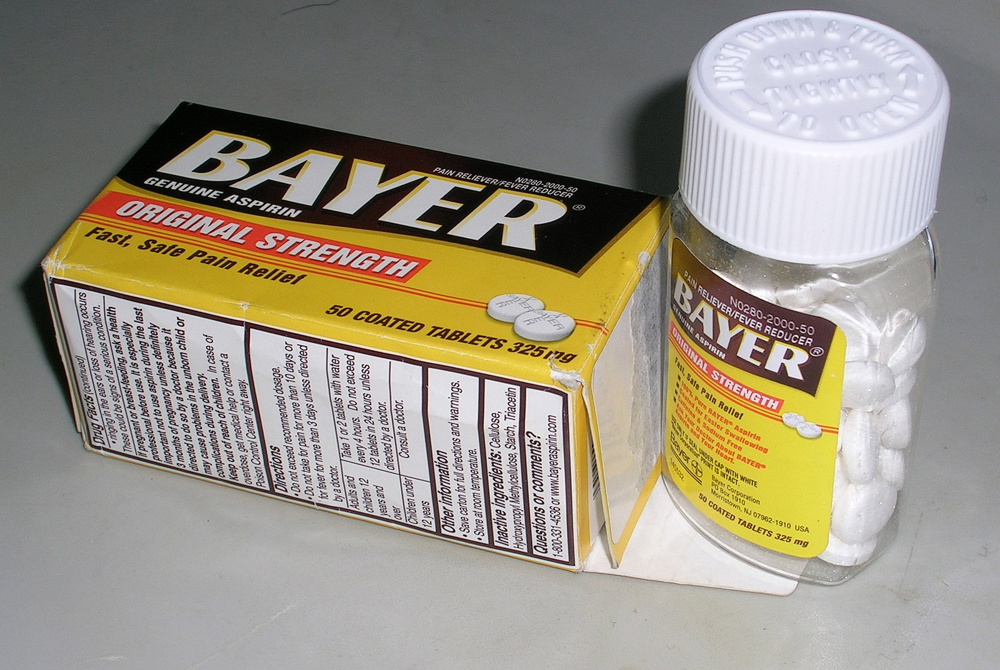

The Predicted Image Class is 9
Predicting image (web2.png) class
1/1 [==============================] - 0s 32ms/step
9
[1.5385189]
1/1 [==============================] - 0s 42ms/step
8
[1.5385189]
1/1 [==============================] - 0s 51ms/step
7
[1.5385189]
1/1 [==============================] - 0s 33ms/step
6
[1.5385189]
1/1 [==============================] - 0s 54ms/step
5
[1.5385189]
1/1 [==============================] - 0s 34ms/step
40
[1.5385189]
1/1 [==============================] - 0s 41ms/step
4
[1.5385189]
1/1 [==============================] - 0s 45ms/step
39
[1.5385189]
1/1 [==============================] - 0s 47ms/step
38
[1.5385189]
1/1 [==============================] - 0s 35ms/step
37
[1.5385189]
1/1 [==============================] - 0s 52ms/step
36
[1.5385189]
1/1 [==============================] - 0s 68ms/step
35
[1.5385189]
1/1 [==============================] - 0s 53ms/step
34
[1.5385189]
1/1 [==============================] - 0s 44ms/step
33
[1.5385189]
1/1

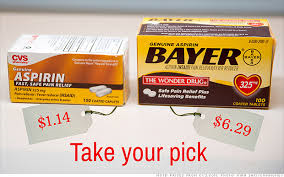

The Predicted Image Class is 9
Predicting image (web3.png) class
1/1 [==============================] - 0s 26ms/step
9
[1.5079229]
1/1 [==============================] - 0s 21ms/step
8
[1.5079229]
1/1 [==============================] - 0s 21ms/step
7
[1.5079229]
1/1 [==============================] - 0s 22ms/step
6
[1.5079229]
1/1 [==============================] - 0s 20ms/step
5
[1.5079229]
1/1 [==============================] - 0s 20ms/step
40
[1.5079229]
1/1 [==============================] - 0s 21ms/step
4
[1.5079229]
1/1 [==============================] - 0s 21ms/step
39
[1.5079229]
1/1 [==============================] - 0s 28ms/step
38
[1.5079229]
1/1 [==============================] - 0s 28ms/step
37
[1.5079229]
1/1 [==============================] - 0s 21ms/step
36
[1.5079229]
1/1 [==============================] - 0s 22ms/step
35
[1.5079229]
1/1 [==============================] - 0s 23ms/step
34
[1.5079229]
1/1 [==============================] - 0s 22ms/step
33
[1.5079229]
1/1

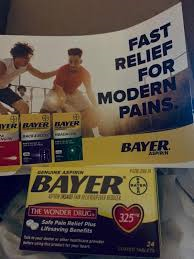

The Predicted Image Class is 9
Done predicting images in the folder.
Prediction for Class 2
Predicting image (web1.png) class
1/1 [==============================] - 0s 43ms/step
9
[0.]
1/1 [==============================] - 0s 34ms/step
8
[0.]
1/1 [==============================] - 0s 39ms/step
7
[0.]
1/1 [==============================] - 0s 40ms/step
6
[0.]
1/1 [==============================] - 0s 59ms/step
5
[0.]
1/1 [==============================] - 0s 39ms/step
40
[0.]
1/1 [==============================] - 0s 50ms/step
4
[0.]
1/1 [==============================] - 0s 59ms/step
39
[0.]
1/1 [==============================] - 0s 51ms/step
38
[0.]
1/1 [==============================] - 0s 36ms/step
37
[0.]
1/1 [==============================] - 0s 30ms/step
36
[0.]
1/1 [==============================] - 0s 59ms/step
35
[0.]
1/1 [==============================] - 0s 50ms/step
34
[0.]
1/1 [==============================] - 0s 55ms/step
33
[0.]
1/1 [==============================] - 0

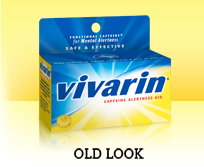

The Predicted Image Class is 9
Done predicting images in the folder.
Prediction for Class 1
Predicting image (web1.png) class
1/1 [==============================] - 0s 34ms/step
9
[0.]
1/1 [==============================] - 0s 46ms/step
8
[0.]
1/1 [==============================] - 0s 62ms/step
7
[0.]
1/1 [==============================] - 0s 41ms/step
6
[0.]
1/1 [==============================] - 0s 58ms/step
5
[0.]
1/1 [==============================] - 0s 66ms/step
40
[0.]
1/1 [==============================] - 0s 53ms/step
4
[0.]
1/1 [==============================] - 0s 31ms/step
39
[0.]
1/1 [==============================] - 0s 36ms/step
38
[0.]
1/1 [==============================] - 0s 31ms/step
37
[0.]
1/1 [==============================] - 0s 31ms/step
36
[0.]
1/1 [==============================] - 0s 34ms/step
35
[0.]
1/1 [==============================] - 0s 32ms/step
34
[0.]
1/1 [==============================] - 0s 31ms/step
33
[0.]
1/1 [==============================] - 0

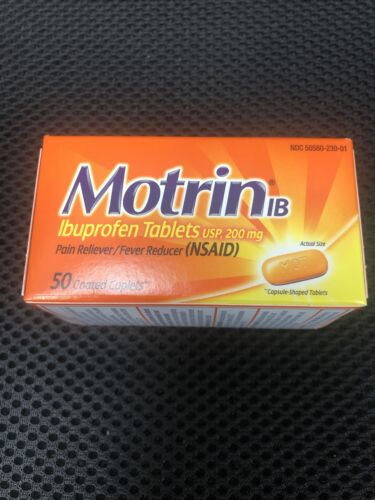

The Predicted Image Class is 9
Predicting image (web2.png) class
1/1 [==============================] - 0s 33ms/step
9
[1.6765805]
1/1 [==============================] - 0s 31ms/step
8
[1.6765805]
1/1 [==============================] - 0s 31ms/step
7
[1.6765805]
1/1 [==============================] - 0s 34ms/step
6
[1.6765805]
1/1 [==============================] - 0s 31ms/step
5
[1.6765805]
1/1 [==============================] - 0s 31ms/step
40
[1.6765805]
1/1 [==============================] - 0s 32ms/step
4
[1.6765805]
1/1 [==============================] - 0s 37ms/step
39
[1.6765805]
1/1 [==============================] - 0s 32ms/step
38
[1.6765805]
1/1 [==============================] - 0s 32ms/step
37
[1.6765805]
1/1 [==============================] - 0s 31ms/step
36
[1.6765805]
1/1 [==============================] - 0s 37ms/step
35
[1.6765805]
1/1 [==============================] - 0s 32ms/step
34
[1.6765805]
1/1 [==============================] - 0s 29ms/step
33
[1.6765805]
1/1

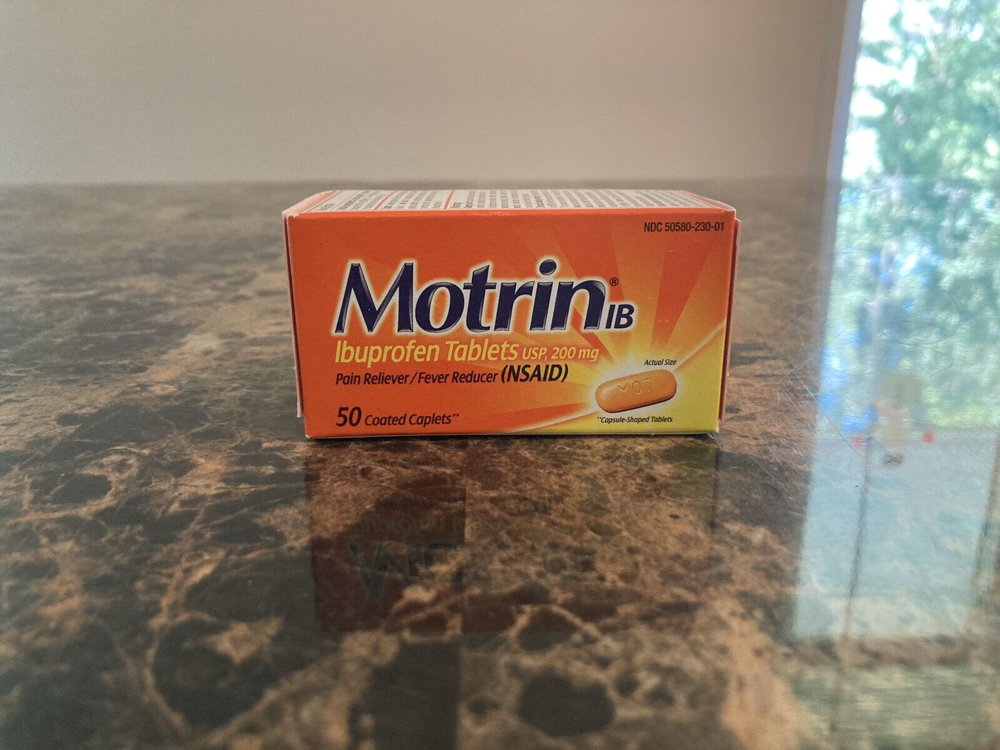

The Predicted Image Class is 9
Done predicting images in the folder.
Prediction for Class 4
Done predicting images in the folder.
Total Accuracy is 0.0 %


In [57]:
# The path to the training images folder
training_folder_path_r1 = "/content/drive/MyDrive/Product Recoginition/Training Data"

# The path to the testing images folder
testing_folder_path_r1 = "/content/drive/MyDrive/test samples class"

# The path to the pre-trained model
model_path_r = "/content/drive/MyDrive/siamese_model-final"

# The path to the pre-trained model
encoder_path_r = "/content/drive/MyDrive/encoder"

# Load the trained Siamese Model
model_r = load_model(model_path_r)

# Load the encoder
encoder_r = load_model(encoder_path_r)

total_images_num_r1 = 0
correct_pred_r1 = 0
accuracy_r1 = 0

for class_folder_r1 in os.listdir(testing_folder_path_r1):
    class_path_r1 = os.path.join(testing_folder_path_r1, class_folder_r1)

    if os.path.exists(class_path_r1):
        # Extract numeric class label from the folder name
        class_label_r1 = int(class_folder_r1)

        print(f"Prediction for Class {class_label_r1}")
        print("=" * 50)

        for root_r1, _, images_r1 in os.walk(class_path_r1):
            for image_r1 in images_r1:
                image_path_r1 = os.path.join(root_r1, image_r1)

                print(f"Predicting image ({image_r1}) class")
                print("=" * 25)

                try:
                    total_images_num_r1 += 1

                    # preprocessing the test image
                    image_preprocessed_r1 = read_script_image(image_path_r1)

                    # Get the encodings for the images
                    encoding1 = encoder_r.predict(image_preprocessed_r1)

                    # Creating an empty list
                    similarity_list_r1 = []

                    for class_folder_comp_with_r1 in os.listdir(training_folder_path_r1):
                        class_path_comp_with_r1 = os.path.join(training_folder_path_r1, class_folder_comp_with_r1)

                        if os.path.exists(class_path_comp_with_r1):
                            # Extract numeric class label from the folder name
                            class_label_comp_with_r1 = int(class_folder_comp_with_r1)
                            image_counter_r1 = 0

                            for root_c_w_r1, _, images_c_w_r1 in os.walk(class_path_comp_with_r1):
                                for image_c_w_r1 in images_c_w_r1:
                                    image_path_c_w_r1 = os.path.join(root_c_w_r1, image_c_w_r1)

                                    # preprocessing the train image
                                    image_preprocessed_c_w_r1 = read_script_image(image_path_c_w_r1)

                                    # Get the encodings for the images
                                    encoding2 = encoder_r.predict(image_preprocessed_c_w_r1)

                                    # Make predictions on the training set
                                    predictions_r1 = np.sum(np.square(encoding1-encoding2), axis=-1)

                                    similarity_list_r1.append((class_label_comp_with_r1, predictions_r1))
                                    print(class_label_comp_with_r1)
                                    print(predictions_r1)

                                    image_counter_r1 += 1
                                    if image_counter_r1 == 1:
                                        break

                                if image_counter_r1 == 1:
                                    break
                        else:
                            print(f"Error: {class_path_comp_with_r1} does not exist.")

                    threshold_r1 = 2 # yet to be assigned $$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
                    predicted_class_label_index_r1 = -1

                    for i in range(len(similarity_list_r1)):
                        if similarity_list_r1[i][1] < threshold_r1 and predicted_class_label_index_r1 == -1:
                            predicted_class_label_index_r1 = i

                        elif predicted_class_label_index_r1 != -1:
                            if similarity_list_r1[i][1] < similarity_list_r1[predicted_class_label_index_r1][1]:
                                predicted_class_label_index_r1 = i

                    # Display the image and print the prediction
                    testing_image_r1 = cv2.imread(image_path_r1)
                    cv2_imshow(testing_image_r1)

                    if predicted_class_label_index_r1 == -1:
                        print("No matches found.")
                        print("=" * 10)
                    else:
                        print(f"The Predicted Image Class is {similarity_list_r1[predicted_class_label_index_r1][0]}")
                        print("=" * 10)
                        if similarity_list_r1[predicted_class_label_index_r1][1] == class_label_r1:
                            correct_pred_r1 += 1

                except Exception as e:
                    print(f"Error processing image {image_path_r1}: {e}")

        print("Done predicting images in the folder.")
        print("=" * 100)

    else:
        print(f"Error: {class_path_r1} does not exist.")

accuracy_r1 = (correct_pred_r1 / total_images_num_r1) * 100

print(f"Total Accuracy is {accuracy_r1} %")


#### testscript for part b (recognition) - case 2

1/1 [==============================] - 0s 31ms/step
4.png
[1.3494945]
1/1 [==============================] - 0s 33ms/step
1.png
[1.6765805]
1/1 [==============================] - 0s 38ms/step
3.png
[1.5549079]
1/1 [==============================] - 0s 21ms/step
2.png
[1.844996]
Done predicting images in the folder.


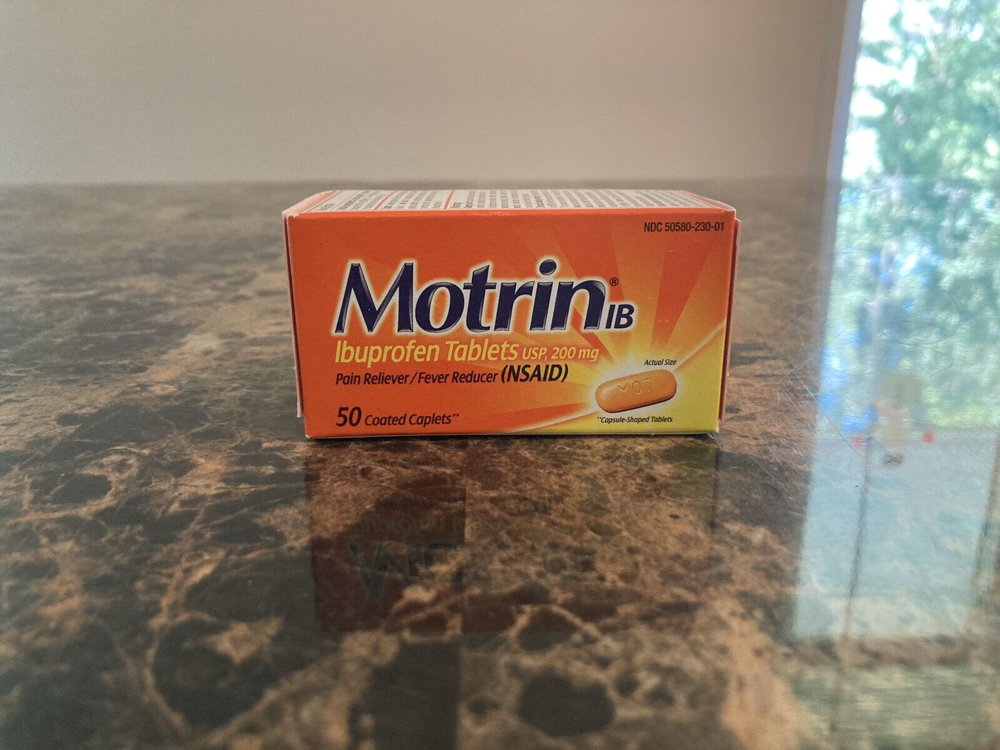

The Predicted Image Class is 4.png


In [58]:
# The path to the anchor image
anchor_path_r2 = "/content/drive/MyDrive/test samples rec/Anchor.png"

# The path to the testing images folder
testing_folder_path_r2 = "/content/drive/MyDrive/test samples rec"


# preprocessing the anchor image
anchor_image_preprocessed_r2 = read_script_image(anchor_path_r2)

# Get the encodings for the anchor image
anchor_encoding = encoder_r.predict(anchor_image_preprocessed_r2)

# Creating an empty list
similarity_list_r2 = []

total_images_num_r2 = 0
correct_pred_r2 = 0
accuracy_r2 = 0

for root_r2, _, images_r2 in os.walk(testing_folder_path_r2):
    for image_r2 in images_r2:
        image_path_r2 = os.path.join(root_r2, image_r2)

        if image_path_r2 == anchor_path_r2:
            continue

        try:
            total_images_num_r2 += 1

            # preprocessing the test image
            image_preprocessed_r2 = read_script_image(image_path_r2)

            # Get the encodings for the images
            image_preprocessed_encoding = encoder_r.predict(image_preprocessed_r2)

            # Make predictions on the validation set
            predictions_r2 = np.sum(np.square(anchor_encoding-image_preprocessed_encoding), axis=-1)

            similarity_list_r2.append((image_r2, predictions_r2))
            print(image_r2)
            print(predictions_r2)

        except Exception as e:
            print(f"Error processing image {image_path_r2}: {e}")

print("Done predicting images in the folder.")
print("=" * 100)

threshold_r2 = 1.6 # yet to be assigned $$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
predicted_image_index_r2 = -1

for i in range(len(similarity_list_r2)):
    if similarity_list_r2[i][1] < threshold_r2 and predicted_image_index_r2 == -1:
        predicted_image_index_r2 = i

    elif predicted_image_index_r2 != -1:
        if similarity_list_r2[i][1] < similarity_list_r2[predicted_image_index_r2][1]:
            predicted_image_index_r2 = i

# Display the image and print the prediction
testing_image_r2 = cv2.imread(anchor_path_r2)
cv2_imshow(testing_image_r2)

if predicted_image_index_r2 == -1:
    print("No matches found.")
    print("=" * 10)
else:
    print(f"The Predicted Image Class is {similarity_list_r2[predicted_image_index_r2][0]}")
    print("=" * 10)
